In [2]:
import warnings
warnings.filterwarnings('ignore')

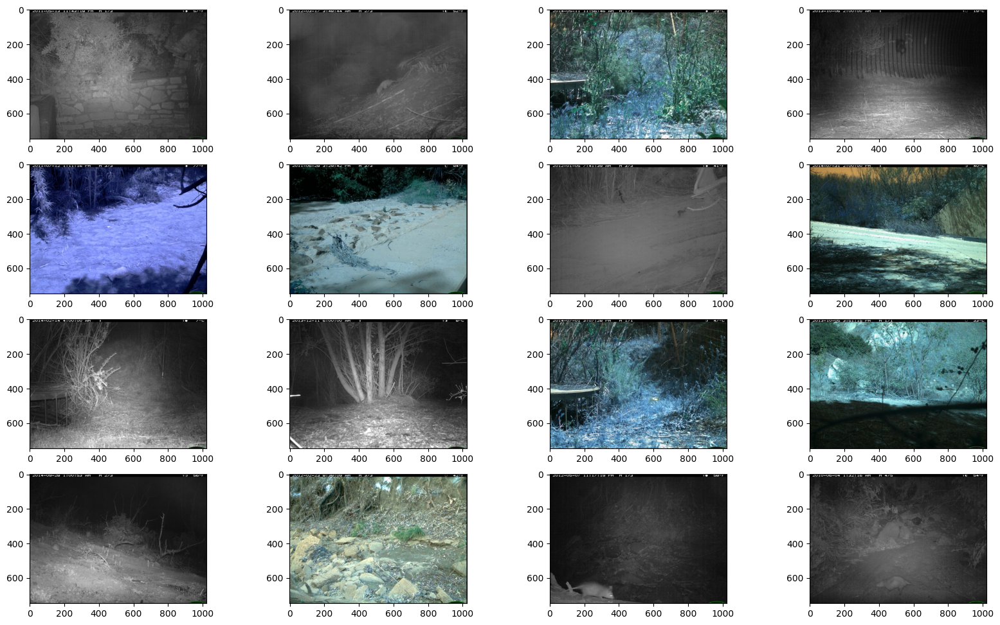

In [2]:
%run src2\pre_transformer.py

In [3]:
%run src2\call_transformer2.py

(196299, 32, 32, 3)
(153730, 32, 32, 3)
(196299, 14)
Saving content/transformed_data_clahe/Resized_xTrain.npy
Saving content/transformed_data_clahe/Resized_yTrain.npy
Saving content/transformed_data_clahe/Resized_xTest.npy
Total time taken for transforming images is 8444.294172525406 seconds


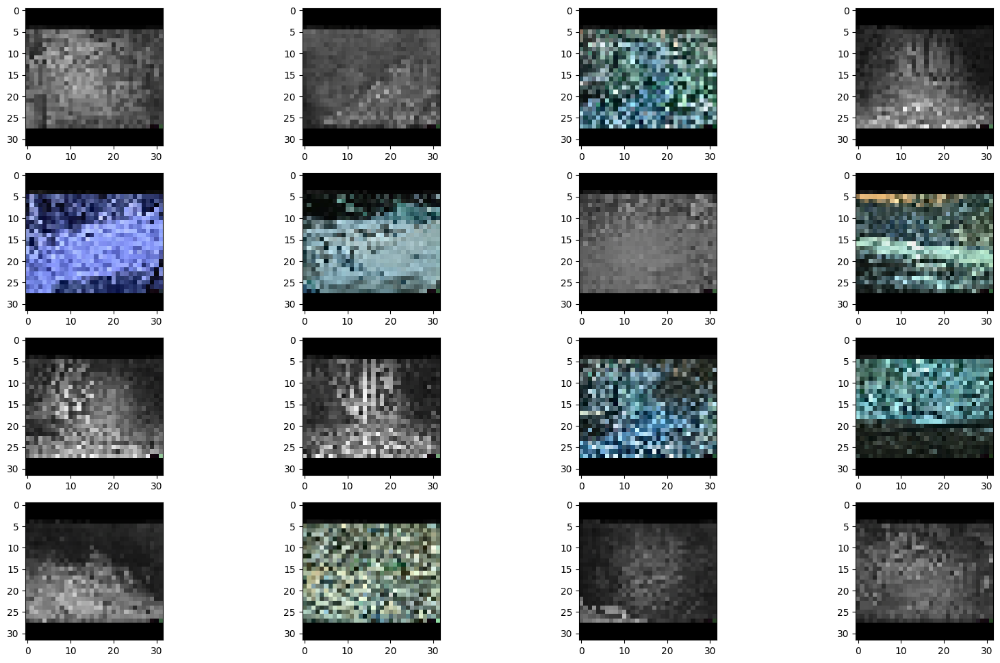

In [4]:
%run src2\post_transformer2.py

# Model implementation

In [3]:
import sys
import numpy as np
import tensorflow.keras
import pandas as pd
import sklearn as sk
import tensorflow as tf
import glob
import os
import json
print("GPU is", "available" if tf.test.is_gpu_available() else "NOT AVAILABLE")

GPU is available


In [4]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
from src2.pre_modelling import load_and_preprocess_data
from src2.metrics import F1PR_History
from src2.constants import *

X_train, X_val, y_train, y_val = load_and_preprocess_data()
f1_metrics = F1PR_History((X_val,y_val))

In [7]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((176669, 32, 32, 3), (19630, 32, 32, 3), (176669, 14), (19630, 14))

## Resnet

In [5]:
from src2.model_final import train_model
resnet101, history_resnet101 = train_model("resnet",X_train, y_train, X_val, y_val, f1_metrics)

Model: "resnet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 1, 1, 2048)        42658176  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 14)                28686     
                                                                 
Total params: 42,686,862
Trainable params: 42,581,518
Non-trainable params: 105,344
_________________________________________________________________
Epoch 1/10
614/614 [==============================] - 8s 11ms/step
val_f1: 0.4711 — val_precision: 0.5225 — val_recall: 0.4680

Epoch 1: val_accuracy improved from -inf to 0.81966, saving model to model_resnet_clahe_20240503144149.h5
2761/2

In [41]:
def load_best_model(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"model_{model_name}_clahe_*.h5")
    model_files = glob.glob(pattern)

    if not model_files:
        print(f"No model found with name '{model_name}'")
        return None
    latest_model_file = max(model_files, key=os.path.getmtime)
    
    model = tf.keras.models.load_model(latest_model_file)
    print(f"Loaded best model '{latest_model_file}'")
    
    return model
resnet101 = load_best_model("resnet")

def load_json_file(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"history_{model_name}_clahe.json")
    with open(pattern, 'r') as file:
        data = json.load(file)
        return data
history_resnet101 = load_json_file("resnet")

Loaded best model 'C:\Users\susha\Documents\Workspace\ML_project\species_detection_python\model_resnet_clahe_20240503144149.h5'


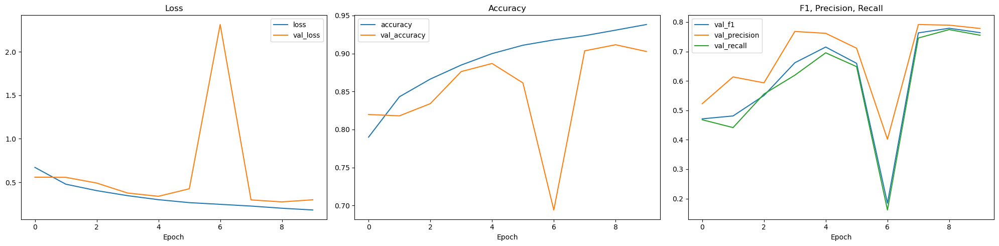

Resnet Model Performance:
Training Loss: 0.18268868327140808
Validation Loss: 0.29992005228996277
Training Accuracy: 0.9381668567657471
Validation Accuracy: 0.9026489853858948
Validation F1 Score: 0.7641082847279183
Validation Precision: 0.7783411954207929
Validation Recall: 0.7552504241573248


In [42]:
from src2.save_and_plot import save_and_plot
save_and_plot(history_resnet101,"resnet")

614/614 [==============================] - 8s 11ms/step


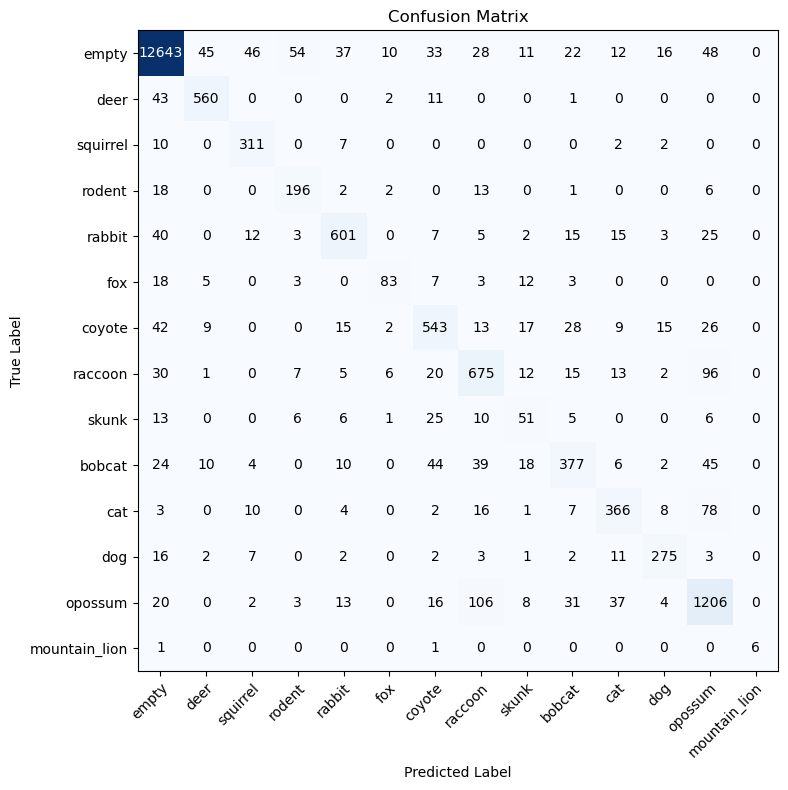

In [43]:
from src2.get_confusion_matrix import get_confusion_matrix
get_confusion_matrix(resnet101, X_val, y_val)

## Densenet

In [9]:
from src2.model_final import train_model
densenet121, history_densenet121 = train_model("densenet",X_train, y_train, X_val, y_val, f1_metrics)

Model: "densenet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 1, 1, 1024)        7037504   
                                                                 
 global_average_pooling2d_1   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 14)                14350     
                                                                 
Total params: 7,051,854
Trainable params: 6,968,206
Non-trainable params: 83,648
_________________________________________________________________
Epoch 1/10
614/614 [==============================] - 8s 11ms/step
val_f1: 0.0868 — val_precision: 0.1337 — val_recall: 0.1004

Epoch 1: val_accuracy improved from -inf to 0.35563, saving model to model_densenet_clahe_20240503150428.h5
2761/

In [11]:
def load_best_model(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"model_{model_name}_clahe_*.h5")
    model_files = glob.glob(pattern)

    if not model_files:
        print(f"No model found with name '{model_name}'")
        return None
    latest_model_file = max(model_files, key=os.path.getmtime)
    
    model = tf.keras.models.load_model(latest_model_file)
    print(f"Loaded best model '{latest_model_file}'")
    
    return model
densenet121 = load_best_model("densenet")

def load_json_file(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"history_{model_name}_clahe.json")
    with open(pattern, 'r') as file:
        data = json.load(file)
        return data
history_densenet121 = load_json_file("densenet")

Loaded best model 'C:\Users\susha\Documents\Workspace\ML_project\species_detection_python\model_densenet_clahe_20240503150428.h5'


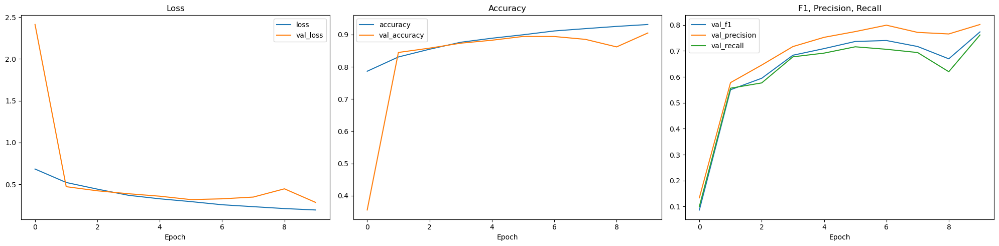

Densenet Model Performance:
Training Loss: 0.1935189962387085
Validation Loss: 0.28396323323249817
Training Accuracy: 0.9314311146736145
Validation Accuracy: 0.9050942659378052
Validation F1 Score: 0.7730838659244377
Validation Precision: 0.8016821279139149
Validation Recall: 0.7612289404631862


In [12]:
from src2.save_and_plot import save_and_plot
save_and_plot(history_densenet121,"densenet")

614/614 [==============================] - 8s 11ms/step


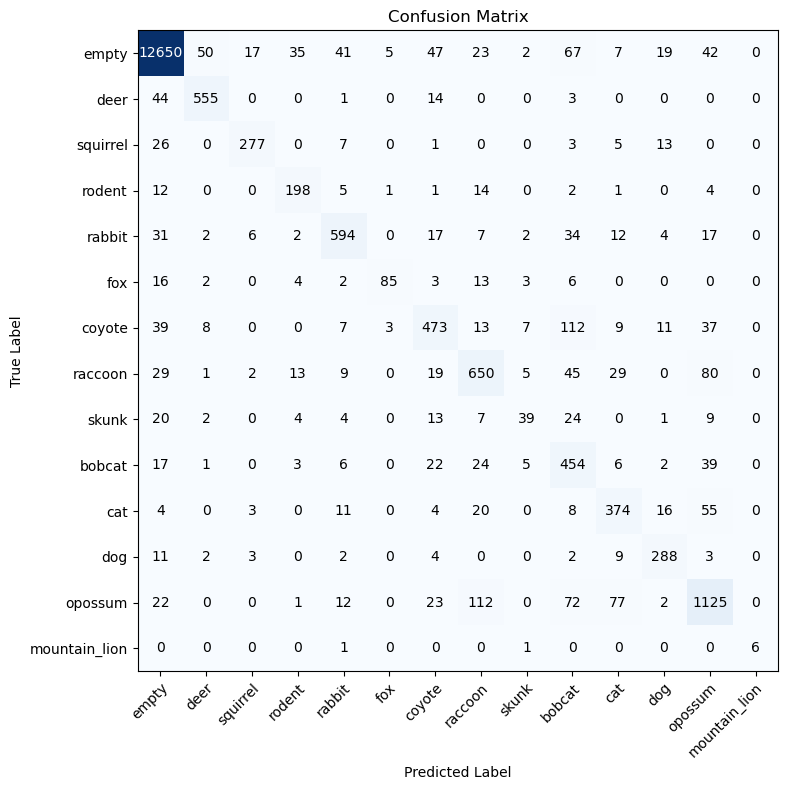

In [13]:
from src2.get_confusion_matrix import get_confusion_matrix
get_confusion_matrix(densenet121,X_val, y_val)

### Predicting test images

In [67]:
BASE_DIR = os.path.join(os.getcwd(), "content","transformed_data_clahe")

In [68]:
def load_and_preprocess_test_data():
    x_test_path = os.path.join(BASE_DIR, "Resized_xTest.npy")
    image_array = np.load(x_test_path)
    image_array = image_array.astype('float32')
    image_array /= 255.
    return image_array

test_image_array = load_and_preprocess_test_data()

In [69]:
import matplotlib.pyplot as plt
import cv2
import pandas as pd

TRAIN_FILE_PATH = os.path.join(os.getcwd(), "content","transformed_content","sample_submission.csv")

def plot_images(train_df, cols, rows, titles=None):
    figure = plt.figure(figsize=(5 * cols, 3 * rows))
    for i in range(cols * rows):
        image_path = train_df.loc[i, 'Id']
        image = cv2.imread(f'content/transformed_content/test_images/{image_path}.jpg')
        ax = figure.add_subplot(rows, cols, i + 1)
        if(image is not None):
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if titles:
            ax.set_title(titles[i])

    plt.tight_layout()
    plt.show()

In [57]:
dummies_to_label = {'0': 0, '1': 1, '2': 3, '3': 4, '4': 8, '5': 10, '6': 11, '7': 13, '8': 14, '9': 16,
                    '10': 17, '11': 18, '12': 19, '13': 22}

label_to_animal = {0: 'empty', 1: 'deer', 3: 'squirrel', 4: 'rodent', 8: 'rabbit', 10: 'fox', 11: 'coyote',
                   13: 'raccoon', 14: 'skunk', 16: 'bobcat', 17: 'cat', 18: 'dog', 19: 'opossum',
                   22: 'mountain_lion'}

### Resnet prediction

In [71]:
# Predict using the loaded model
result = resnet101.predict(test_image_array)
predictions = result.argmax(axis=1)

4805/4805 [==============================] - 54s 11ms/step


In [72]:
predictions[:16]

array([8, 1, 1, 0, 0, 2, 0, 8, 8, 1, 6, 0, 8, 0, 6, 6], dtype=int64)

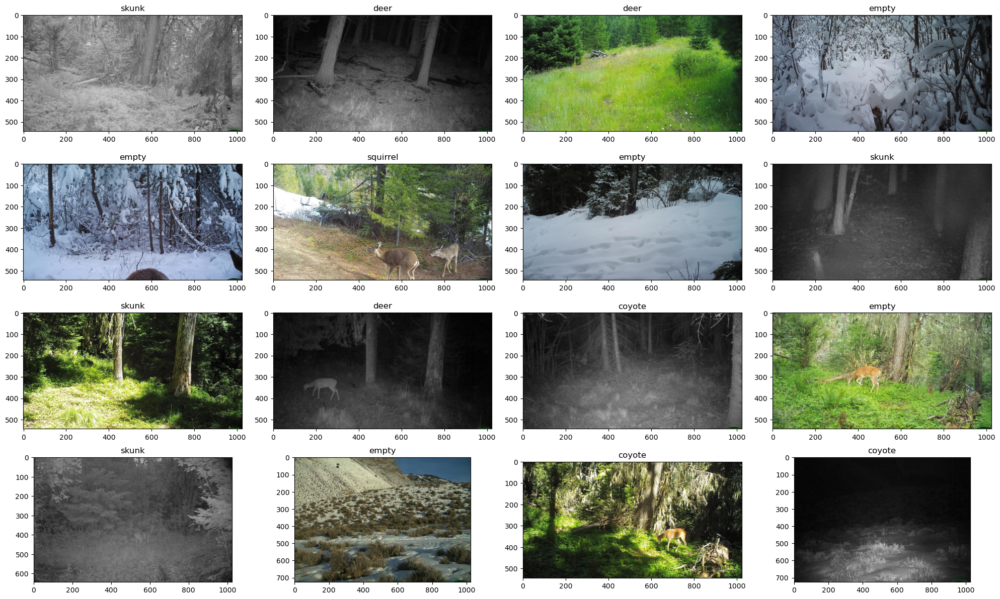

In [73]:
titles =[i for i in result.argmax(axis=1)]
titles = [dummies_to_label[str(i)]for i in titles]
titles = [label_to_animal[i] for i in titles]

train_df = pd.read_csv(TRAIN_FILE_PATH)
plot_images(train_df, 4, 4, titles)

### Densenet prediction

In [74]:
result = densenet121.predict(test_image_array)

4805/4805 [==============================] - 55s 11ms/step


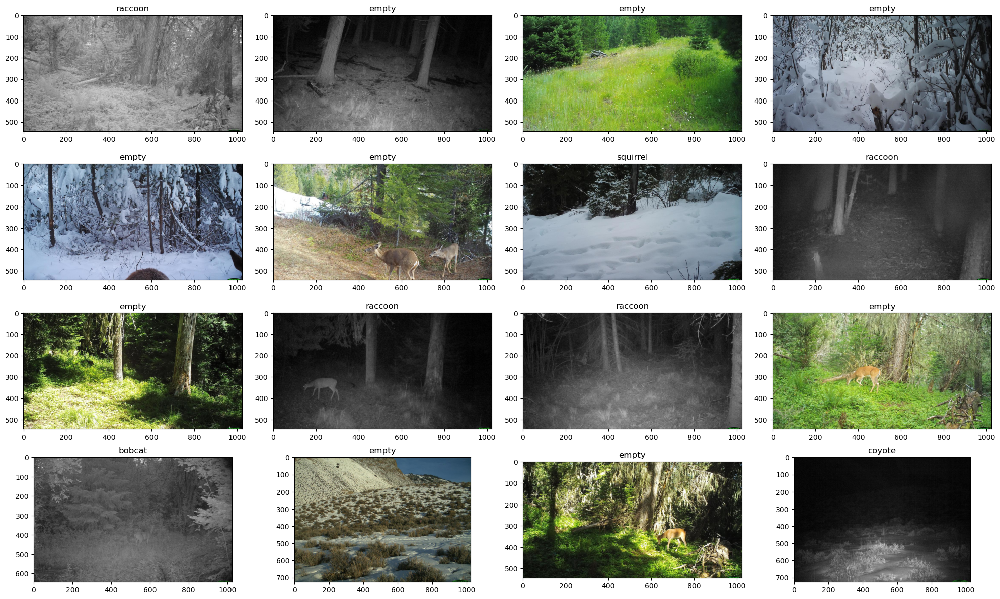

In [75]:
titles =[i for i in result.argmax(axis=1)]
titles = [dummies_to_label[str(i)]for i in titles]
titles = [label_to_animal[i] for i in titles]

train_df = pd.read_csv(TRAIN_FILE_PATH)
plot_images(train_df, 4, 4, titles)